# X-Guard: Interpretability & Adversarial Robustness Report
The ```xai_observations.jsonl``` file is a high-resolution log of feature importance. It represents the "spatial awareness" of our **X-Gaurd** model during **adversarial training**. While standard logs tell us if the model was right or wrong, this file explains why by documenting exactly which tokens (features) the model prioritized to make its defensive decisions. It is the bridge between a "black box" model and a verifiable security tool.

## 0. ⚙ Requirements

In [1]:
import pandas as pd
import json
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display, Markdown, HTML, clear_output
import ipywidgets as widgets
import io
import base64

## 1. 🛠️ DATA LOADING & NORMALIZATION

In [2]:
observations = []
try:
    with open('/kaggle/input/notebooks/nidalshahin/x-gaurd-min-max-adversarial-tuning-with-xai/xai_observations.jsonl', 'r') as f:
        for line in f:
            row = json.loads(line)
            # Normalize mixed batch formats (takes first sample if batched)
            scores = row['scores'][0] if isinstance(row['scores'][0], list) else row['scores']
            tokens = row['tokens']
            
            observations.append({
                'step': row['step'],
                'tokens': tokens,
                'scores': scores,
                'max_val': np.max(scores),
                'mean_val': np.mean(scores),
                'std_val': np.std(scores)
            })
    df_meta = pd.DataFrame(observations)
    print(f"✅ Loaded {len(df_meta)} XAI snapshots.")
except FileNotFoundError:
    print("❌ File 'xai_observations.jsonl' not found.")

✅ Loaded 402 XAI snapshots.


## 2. 📊 STATISTICAL SUMMARY TABLE

In [3]:
display(Markdown("### 📈 Global Attribution Statistics"))
summary_stats = pd.DataFrame({
    "Metric": ["Total Snapshots", "Avg Peak Attribution", "Avg Mean Importance", "Max Observed Signal"],
    "Value": [
        len(df_meta), 
        f"{df_meta['max_val'].mean():.4f}", 
        f"{df_meta['mean_val'].mean():.4f}", 
        f"{df_meta['max_val'].max():.4f}"
    ]
})
display(summary_stats)

### 📈 Global Attribution Statistics

,Metric,Value
0,Total Snapshots,402
1,Avg Peak Attribution,1.7346
2,Avg Mean Importance,0.0172
3,Max Observed Signal,18.0468


## 3. 🛡️ TOP 20 "ATTACK INDICATOR" TOKENS

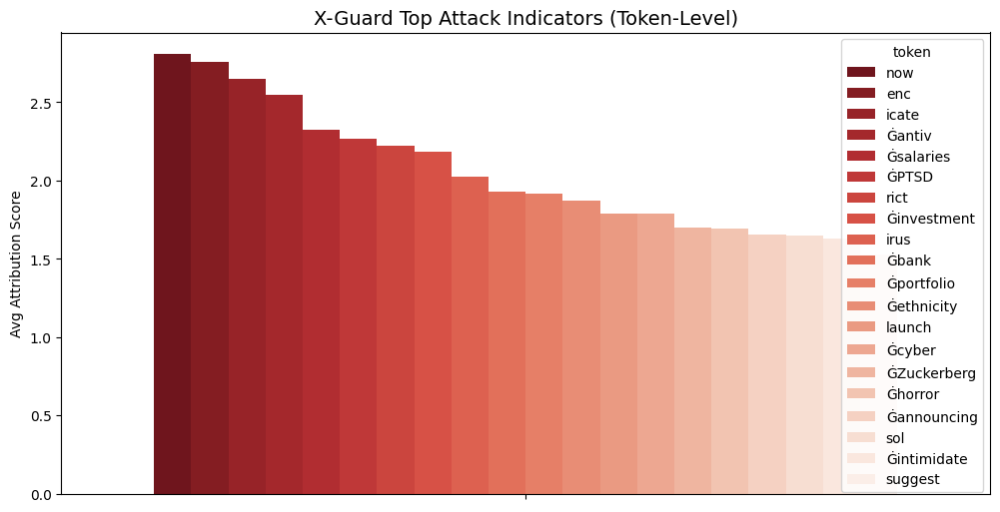

In [4]:
token_data = []
for _, row in df_meta.iterrows():
    for t, s in zip(row['tokens'], row['scores']):
        if t not in ['<s>', '</s>', '<pad>', '[PAD]', '[CLS]', '[SEP]']:
            token_data.append({'token': t, 'importance': s})

df_tokens = pd.DataFrame(token_data)
top_tokens = df_tokens.groupby('token')['importance'].agg(['mean', 'count']).sort_values('mean', ascending=False).head(20)

plt.figure(figsize=(12, 6))
sns.barplot(hue=top_tokens.index, y=top_tokens['mean'], palette="Reds_r")
plt.title("X-Guard Top Attack Indicators (Token-Level)", fontsize=14)
plt.xticks(rotation=45)
plt.ylabel("Avg Attribution Score")
plt.show()

## 4. 🌊 GLOBAL VULNERABILITY MAP (Positional)

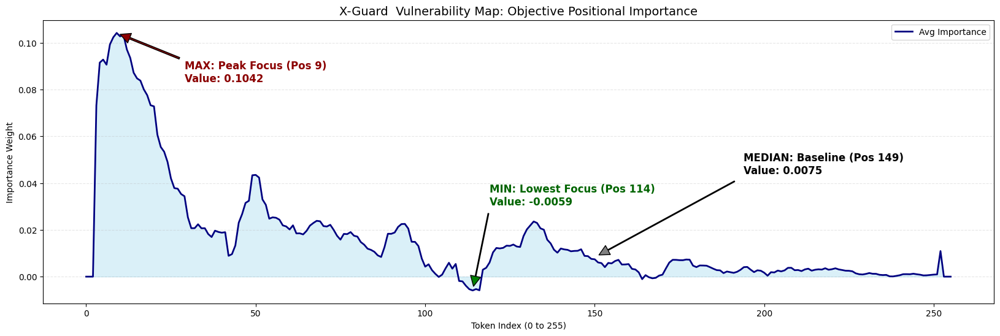

📍 Peak focus is at token 9. This is where X-Guard is most vigilant.
📍 Least focus is at token 114. This is where X-Guard is least vigilant.


In [5]:
# Stacking all scores to find where the model looks most often
all_scores_matrix = np.array([obs['scores'][:256] for obs in observations if len(obs['scores']) >= 256])
positional_avg = np.mean(all_scores_matrix, axis=0)

# Rolling average to smooth out the noise
smoothed = pd.Series(positional_avg).rolling(window=7, center=True).mean().fillna(0)

# --- Dynamic Points Identification ---
max_idx = np.argmax(smoothed)
max_val = smoothed[max_idx]

min_idx = np.argmin(smoothed)
min_val = smoothed[min_idx]

# For median, we find the index whose value is closest to the actual median value
median_val = np.median(smoothed)
median_idx = (np.abs(smoothed - median_val)).argmin()

plt.figure(figsize=(20, 6))
plt.fill_between(range(256), smoothed, color="skyblue", alpha=0.3)
plt.plot(range(256), smoothed, color="navy", linewidth=2, label="Avg Importance")

# 1. Highest Point (Critical Vulnerability/Focus)
plt.annotate(f'MAX: Peak Focus (Pos {max_idx})\nValue: {max_val:.4f}', 
             xy=(max_idx, max_val), xytext=(max_idx+20, max_val*0.8),
             arrowprops=dict(facecolor='darkred', shrink=0.05, width=2),
             fontsize=12, fontweight='bold', color='darkred')

# 2. Median Point (Baseline Attention)
plt.annotate(f'MEDIAN: Baseline (Pos {median_idx})\nValue: {median_val:.4f}', 
             xy=(median_idx, median_val), xytext=(median_idx+45, median_val+max_val*0.35),
             arrowprops=dict(facecolor='gray', shrink=0.05, width=1),
             fontsize=12, fontweight='bold', color='black')

# 3. Lowest Point (Blind Spot/Neutral Zone)
plt.annotate(f'MIN: Lowest Focus (Pos {min_idx})\nValue: {min_val:.4f}', 
             xy=(min_idx, min_val), xytext=(min_idx+5, min_val+max_val*0.35),
             arrowprops=dict(facecolor='green', shrink=0.05, width=1),
             fontsize=12, fontweight='bold', color='darkgreen')

plt.title("X-Guard  Vulnerability Map: Objective Positional Importance", fontsize=14)
plt.xlabel("Token Index (0 to 255)")
plt.ylabel("Importance Weight")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.legend()
plt.show()

print(f"📍 Peak focus is at token {max_idx}. This is where X-Guard is most vigilant.")
print(f"📍 Least focus is at token {min_idx}. This is where X-Guard is least vigilant.")

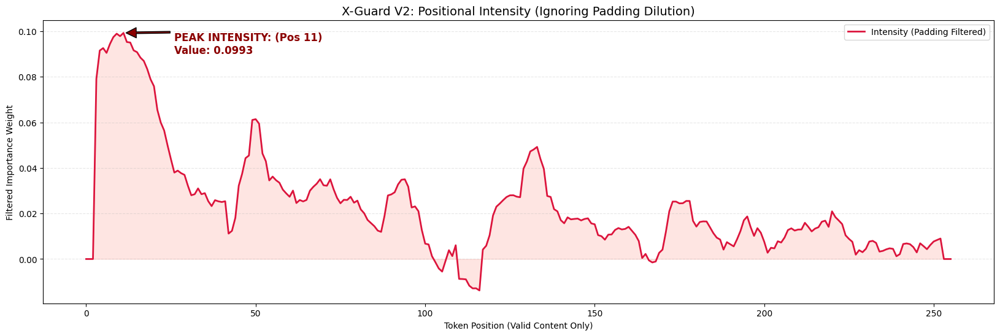

📍 When text is present, X-Guard hits hardest at position 11.
📍 This version prevents short prompts from making the end of the window look 'safe'.


In [6]:
# 1. Create a masked matrix of scores (NaN where padding exists)
# We use NaN so np.nanmean() can ignore these values in the calculation
scores_list = []
special_tokens = {'<pad>', '[PAD]', '<s>', '</s>'}

for obs in observations:
    scores = np.array(obs['scores'][:256])
    tokens = obs['tokens'][:256]
    
    # Create a mask: keep score if token is NOT padding, else NaN
    masked_scores = [
        score if token not in special_tokens else np.nan 
        for score, token in zip(scores, tokens)
    ]
    
    # Ensure length is 256
    if len(masked_scores) < 256:
        masked_scores.extend([np.nan] * (256 - len(masked_scores)))
        
    scores_list.append(masked_scores)

masked_matrix = np.array(scores_list)

# 2. Calculate the mean ignoring NaNs
# This gives the average importance ONLY when a real token was present
# Calculate column means only where at least one real value exists
positional_avg_v2 = np.array([
    np.nanmean(col) if np.any(~np.isnan(col)) else 0.0
    for col in masked_matrix.T
])

# Fill any remaining NaNs (if no prompt was ever 256 tokens long) with 0
positional_avg_v2 = np.nan_to_num(positional_avg_v2)

# 3. Smoothing and Plotting
smoothed_v2 = pd.Series(positional_avg_v2).rolling(window=7, center=True).mean().fillna(0)

max_idx = np.argmax(smoothed_v2)
max_val = smoothed_v2[max_idx]
min_idx = np.argmin(smoothed_v2[smoothed_v2 > 0]) # Min of non-zero areas
min_val = smoothed_v2[min_idx]
median_val = np.median(smoothed_v2[smoothed_v2 > 0])
median_idx = (np.abs(smoothed_v2 - median_val)).argmin()



plt.figure(figsize=(20, 6))
plt.fill_between(range(256), smoothed_v2, color="salmon", alpha=0.2)
plt.plot(range(256), smoothed_v2, color="crimson", linewidth=2, label="Intensity (Padding Filtered)")


# Annotation: Highest Point
plt.annotate(f'PEAK INTENSITY: (Pos {max_idx})\nValue: {max_val:.4f}', 
             xy=(max_idx, max_val), xytext=(max_idx+15, max_val/1.1),
             arrowprops=dict(facecolor='darkred', shrink=0.05, width=2),
             fontsize=12, fontweight='bold', color='darkred')

plt.title("X-Guard V2: Positional Intensity (Ignoring Padding Dilution)", fontsize=14)
plt.xlabel("Token Position (Valid Content Only)")
plt.ylabel("Filtered Importance Weight")
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.legend()
plt.show()

print(f"📍 When text is present, X-Guard hits hardest at position {max_idx}.")
print(f"📍 This version prevents short prompts from making the end of the window look 'safe'.")

## 5. 🔍 INDIVIDUAL BRAIN SCAN


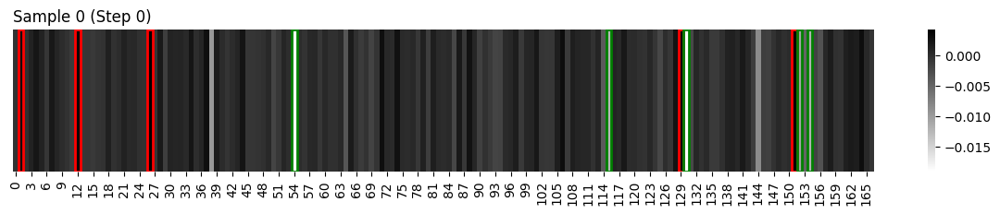


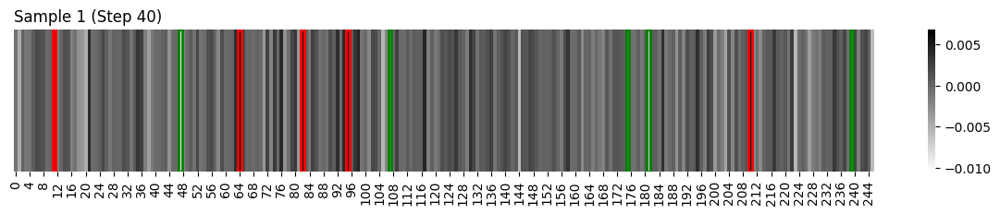


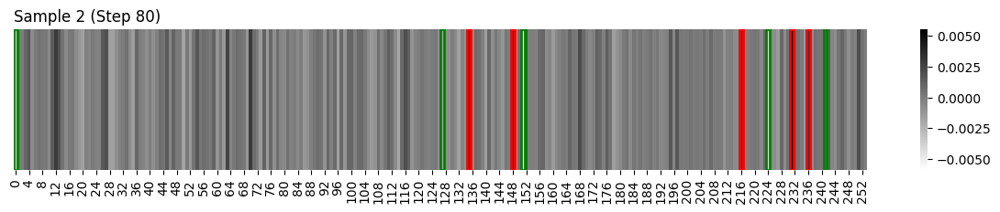


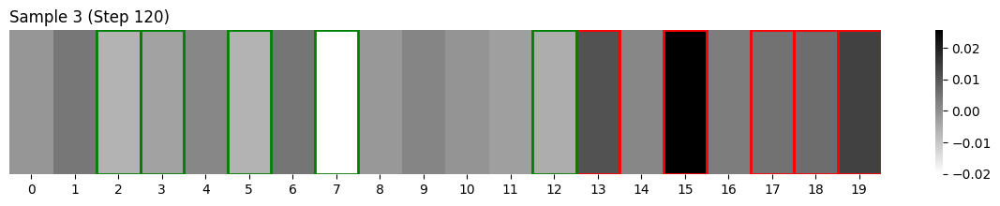


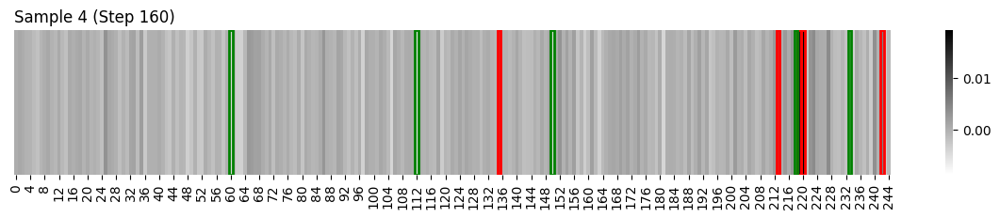


...


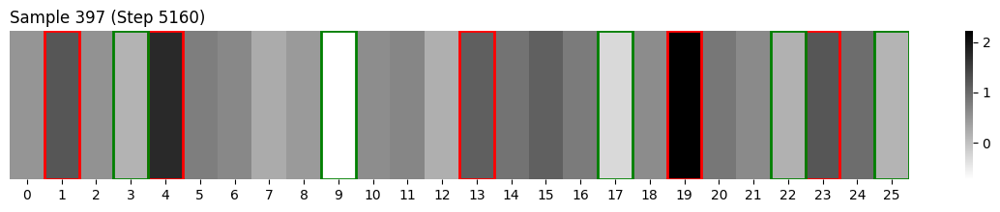


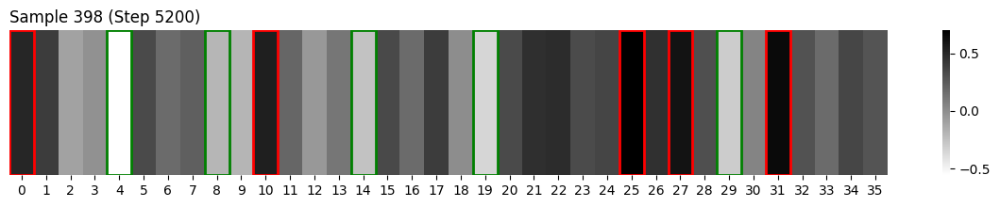


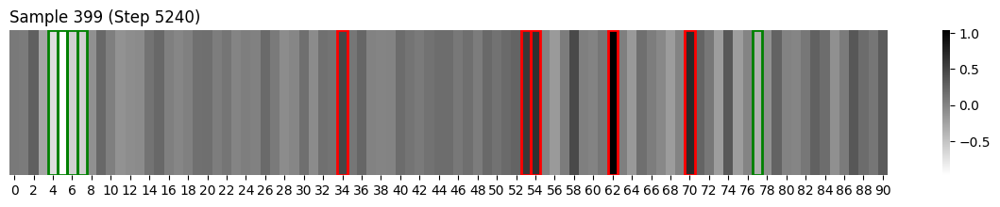


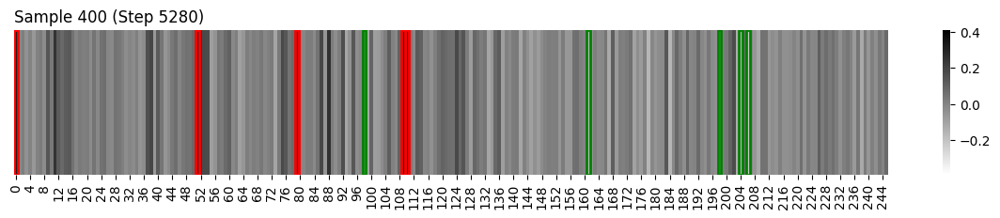


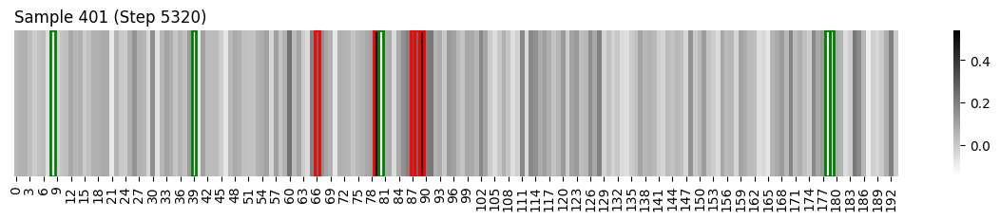

In [7]:
def build_audit_table(tokens, scores, positions, top5_idx, bottom5_idx):
    """Returns HTML string of a 6‑column table."""
    rows = []
    n_top = min(len(top5_idx), 5)
    n_bot = min(len(bottom5_idx), 5)
    
    for i in range(max(n_top, n_bot)):
        ct = tokens[top5_idx[i]] if i < n_top else ""
        cs = scores[top5_idx[i]] if i < n_top else 0.0
        cp = positions[top5_idx[i]] if i < n_top else ""
        
        st = tokens[bottom5_idx[i]] if i < n_bot else ""
        ss = scores[bottom5_idx[i]] if i < n_bot else 0.0
        sp = positions[bottom5_idx[i]] if i < n_bot else ""
        rows.append((ct, cs, cp, st, ss, sp))
    
    html = """
    <table style="width:100%; border-collapse: collapse; font-family: monospace; margin-top: 10px;">
      <thead>
        <tr>
          <th colspan="3" style="border: 1px solid #aaa; padding: 8px; text-align: center; background-color: #2c3e50; color: white;">🔴 Top Critical</th>
          <th colspan="3" style="border: 1px solid #aaa; padding: 8px; text-align: center; background-color: #2c3e50; color: white;">🟢 Least Critical</th>
        </tr>
      </thead>
      <tbody>
        <tr style="background: #1e1e1e; color: white;">
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Token</td>
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Score</td>
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Pos</td>
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Token</td>
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Score</td>
          <td style="border: 1px solid #ddd; padding: 4px; text-align: center;">Pos</td>
        </tr>
    """
    for (ct, cs, cp, st, ss, sp) in rows:
        html += f"""
        <tr>
          <td style="border: 1px solid #ddd; padding: 6px;"><code>{ct}</code></td>
          <td style="border: 1px solid #ddd; padding: 6px;">{cs:.4f}</td>
          <td style="border: 1px solid #ddd; padding: 6px; text-align: center;">{cp}</td>
          <td style="border: 1px solid #ddd; padding: 6px;"><code>{st}</code></td>
          <td style="border: 1px solid #ddd; padding: 6px;">{ss:.4f}</td>
          <td style="border: 1px solid #ddd; padding: 6px; text-align: center;">{sp}</td>
        </tr>"""
    html += "</tbody></td>"
    return html

# Static content generator (saves plot as PNG + returns HTML)
def generate_static_sample_content(index):
    """Returns (plot_html, table_html) for sample at `index`."""
    sample = df_meta.iloc[index]
    special = {'<s>', '</s>', '<pad>', '[PAD]', '[CLS]', '[SEP]', '.'}
    mask = [i for i, t in enumerate(sample['tokens']) if t not in special]
    t_clean = [sample['tokens'][i] for i in mask]
    s_clean = np.array([sample['scores'][i] for i in mask])
    positions = list(range(len(t_clean)))
    
    # Dynamic limit: max 5, max 50% of clean tokens
    N = len(s_clean)
    k = min(5, N // 2)
    if k > 0:
        top_idx = np.argsort(s_clean)[-k:][::-1]
        bottom_idx = np.argsort(s_clean)[:k]
    else:
        top_idx = bottom_idx = np.array([])
    
    # --- Generate plot as PNG (embedded base64) ---
    fig, ax = plt.subplots(figsize=(15, 2))
    sns.heatmap([s_clean], annot=False, cmap="binary", cbar=True, ax=ax)
    for idx in top_idx:
        ax.add_patch(plt.Rectangle((idx, 0), 1, 1, fill=False, edgecolor='red', lw=2))
    for idx in bottom_idx:
        ax.add_patch(plt.Rectangle((idx, 0), 1, 1, fill=False, edgecolor='green', lw=2))
    plt.title(f"Sample {index} (Step {sample['step']})", loc='left')
    plt.yticks([])
    
    buf = io.BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight', dpi=100)
    plt.close(fig)
    buf.seek(0)
    img_base64 = base64.b64encode(buf.read()).decode()
    plot_html = f'<img src="data:image/png;base64,{img_base64}" style="max-width:100%">'
    
    # --- Static table ---
    table_html = build_audit_table(t_clean, s_clean, positions, top_idx, bottom_idx)
    
    return plot_html, table_html

# Display all samples in collapsible sections (static, offline-ready)
display(HTML("<h3 style='color: #ffffff;'>🛡️ X‑Guard Security Audit</h2>"))

# Optional: limit to first N samples for testing, set to None for all
MAX_SAMPLES = None

for idx in range(len(df_meta) if MAX_SAMPLES is None else min(MAX_SAMPLES, len(df_meta))):
    plot_html, table_html = generate_static_sample_content(idx)
    step = df_meta.iloc[idx]['step']
    display(HTML(f"""
    <details>
        <summary style="font-size:1.2em; font-weight:bold; cursor:pointer; padding:8px; background:#000000; border:1px solid #ccc;">
            📌 Sample {idx} &nbsp;|&nbsp; Step: {step}
        </summary>
        <div style="margin-top:10px;">
            {plot_html}
            {table_html}
        </div>
    </details>
    <hr style="margin:15px 0;">
    """))